<a href="https://colab.research.google.com/github/dimoynwa/Computer-vision-tasks/blob/main/Detect_and_count_objects_in_polygon_zone.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!python --version

Python 3.10.12


## Steps in this tutorial

- Prerequisites
- Install `YOLOv5`
- Install `YOLOv8`
- Install `supervision`
- Dataset setup
- Shopping mall example using `YOLOv8`
- Subway example using `YOLOv8`
- Market square using `YOLOv5`

## Prerequisites

Let's make sure we have **GPU** available. Using `nvidia-smi`

In [ ]:
!nvidia-smi

Sun May 19 11:51:09 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   34C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import torch

!nvcc --version
TORCH_VERSION = torch.__version__
CUDA_VERSION = torch.__version__.split('+')[-1]

print(f'Torch version: {TORCH_VERSION}')
print(f'CUDA version: {CUDA_VERSION}')

nvcc: NVIDIA (R) Cuda compiler driver
Copyright (c) 2005-2023 NVIDIA Corporation
Built on Tue_Aug_15_22:02:13_PDT_2023
Cuda compilation tools, release 12.2, V12.2.140
Build cuda_12.2.r12.2/compiler.33191640_0
Torch version: 2.2.1+cu121
CUDA version: cu121


In [ ]:
import os
HOME = os.getcwd()
print(f'HOME: {HOME}')

HOME: /content


## Install YOLOv5

In [ ]:
%cd {HOME}
!git clone https://github.com/ultralytics/yolov5
%cd {HOME}/yolov5
!pip install -rq requirements.txt

from IPython import display
display.clear_output()

## Install YOLOv8

In [ ]:
!pip install ultralytics

from IPython import display
display.clear_output()

import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 29.9/201.2 GB disk)


## Install Detectron2

In [ ]:
!python -m pip install 'git+https://github.com/facebookresearch/detectron2.git'

from IPython import display
display.clear_output()

import detectron2
print(f'Detectron2 version: {detectron2.__version__}')

Detectron2 version: 0.6


## Install supervision

In [ ]:
!pip install supervision==0.2.0

from IPython import display
display.clear_output()

import supervision
print(f'Supervision version: {supervision.__version__}')

Supervision version: 0.2.0


## Download the data

In [ ]:
import os

GOOGLE_DRIVE_VIDEOS_PATH = './drive/MyDrive/Data/'

os.listdir(GOOGLE_DRIVE_VIDEOS_PATH)

['FakeOrRealNews',
 'fra-eng',
 'seq2seq_model.png',
 's2s.h5',
 'seq2seq_glove100d_17_11_2019.h5',
 'SportReviews',
 'decoder_seq2seq_glove100d_18_11_2019.h5',
 'sport_reviews_config.pickle',
 'seq2seq_complex_model.png',
 'eng_fra_config.pickle',
 'encoder_model_fra_eng_no_emb.h5',
 'model.png',
 'NLP',
 'dataset.7z',
 'la_traffic.mp4',
 'zidane.jpg',
 'la_out_traffic.mp4',
 'train',
 'market-square.mp4',
 'subway.mp4',
 'mall.mp4',
 'subway_result.mp4']

In [ ]:
import os

GOOGLE_DRIVE_VIDEOS_PATH = './drive/MyDrive/Data/'
MARKET_SQUARE_VIDEO = os.path.join(GOOGLE_DRIVE_VIDEOS_PATH, 'market-square.mp4')
MALL_VIDEO_PATH = os.path.join(GOOGLE_DRIVE_VIDEOS_PATH, 'mall.mp4')
SUBWAY_VIDEO_PATH = os.path.join(GOOGLE_DRIVE_VIDEOS_PATH, 'subway.mp4')

assert os.path.exists(MARKET_SQUARE_VIDEO)
assert os.path.exists(MALL_VIDEO_PATH)
assert os.path.exists(SUBWAY_VIDEO_PATH)

## Shopping mall YOLOv8 example

In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8s.pt')

100%|██████████| 21.5M/21.5M [00:00<00:00, 238MB/s]


Let's run pretrained YOLOv8 inference on Shopping mall video.


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 38.3ms
Speed: 24.9ms preprocess, 38.3ms inference, 9.5ms postprocess per image at shape (1, 3, 736, 1280)


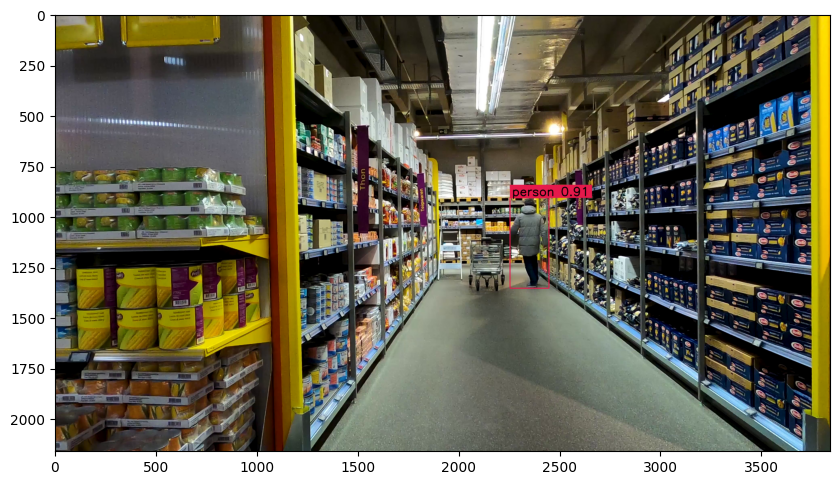

In [ ]:
import supervision as sv

# Get video frames
frame_gen = sv.get_video_frames_generator(MALL_VIDEO_PATH)
frame_iterator = iter(frame_gen)
frame = next(frame_iterator)

# Detect
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_yolov8(results)

# Filter dections, choose only person classes
# Every detection is a tuple (coordinates - xyxy, probability, class, _)
detections = [det for det in detections if det[-2] == 0]

# Annotate
labels = [f'{model.names[class_id]} {confidence:.2f}' for _, confidence, class_id, _ in detections]
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(frame)

### Create a zone on the floor where we will track objects only

Let's add a polygon zone and visualize it.

In [ ]:
video_info = sv.VideoInfo.from_video_path(MALL_VIDEO_PATH)
print(f'Video info: {video_info}')

Video info: VideoInfo(width=3840, height=2160, fps=29, total_frames=1002)


In [ ]:
import numpy as np

def filter_detections(detections: sv.Detections, class_ids: list|int,
                      conf_threshold=.5, mask: np.ndarray = None) -> sv.Detections:

  is_cls_supported = lambda x: x in class_ids if isinstance(class_ids, list) else x == class_ids

  is_mask_supported = mask is not None and len(mask) > 0

  filter_detections = detections
  if is_mask_supported:
    filtered_detections = [det for det, m in zip(detections, mask) if m]

  filtered_detections = [det for det in filtered_detections\
                         if is_cls_supported(det[-2]) and det[1] >= conf_threshold]

  if not filtered_detections:
    return None

  coordinates = np.array([det[0] for det in filtered_detections])
  classes = np.array([det[-2] for det in filtered_detections])
  confidence = np.array([det[1] for det in filtered_detections])
  return sv.Detections(xyxy=coordinates, confidence=confidence, class_id=classes)


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 30.1ms
Speed: 11.4ms preprocess, 30.1ms inference, 2.1ms postprocess per image at shape (1, 3, 736, 1280)


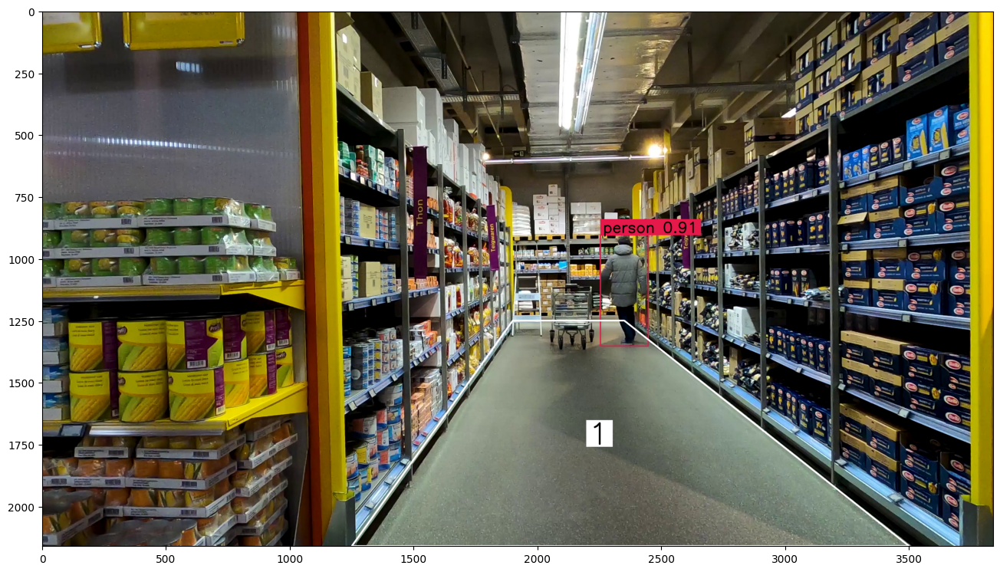

In [ ]:
import numpy as np
import supervision as sv

# Polygon zone coordinates XYXY
polygon_zone = np.array([
    [1900, 1250], [2350, 1250], [3500, 2160], [1250, 2160]
])
video_info = sv.VideoInfo.from_video_path(MALL_VIDEO_PATH)

zone = sv.PolygonZone(polygon=polygon_zone,
                      frame_resolution_wh=video_info.resolution_wh)

# Create annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone, color=sv.Color.white(),
                                         thickness=6, text_thickness=6, text_scale=4)

# Get video frames
frame_gen = sv.get_video_frames_generator(MALL_VIDEO_PATH)
frame_iterator = iter(frame_gen)
frame = next(frame_iterator)

# Detect
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_yolov8(results)

# Filter dections, choose only person classes
# Every detection is a tuple (coordinates - xyxy, probability, class, _)
detections = filter_detections(detections=detections, class_ids=0)
zone.trigger(detections=detections)

# Annotate
labels = [f'{model.names[class_id]} {confidence:.2f}' for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
frame = zone_annotator.annotate(scene=frame)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

## Change counter label location

The counter value is 1 is located in the midle of the zone. Let's move the polygon location


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 37.7ms
Speed: 12.5ms preprocess, 37.7ms inference, 2.3ms postprocess per image at shape (1, 3, 736, 1280)


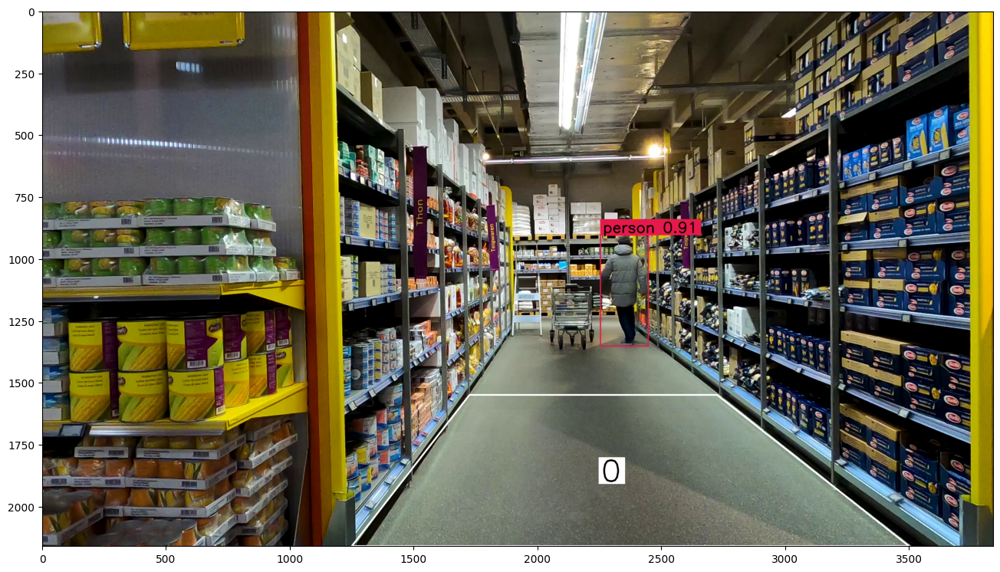

In [ ]:
import numpy as np
import supervision as sv

# Polygon zone coordinates XYXY
polygon_zone = np.array([
    [1725, 1550], [2725, 1550], [3500, 2160], [1250, 2160]
])
video_info = sv.VideoInfo.from_video_path(MALL_VIDEO_PATH)

zone = sv.PolygonZone(polygon=polygon_zone,
                      frame_resolution_wh=video_info.resolution_wh)

# Create annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone, color=sv.Color.white(),
                                         thickness=6, text_thickness=6, text_scale=4)

# Get video frames
frame_gen = sv.get_video_frames_generator(MALL_VIDEO_PATH)
frame_iterator = iter(frame_gen)
frame = next(frame_iterator)

# Detect
results = model(frame, imgsz=1280)[0]
detections = sv.Detections.from_yolov8(results)

# Filter dections, choose only person classes
# Every detection is a tuple (coordinates - xyxy, probability, class, _)
detections = filter_detections(detections=detections, class_ids=0)
zone.trigger(detections=detections)

# Annotate
labels = [f'{model.names[class_id]} {confidence:.2f}' for _, confidence, class_id, _ in detections]
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
frame = zone_annotator.annotate(scene=frame)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

## Video processing

Currently we are annotation just a single frame. Let's do it for the whole video. We will use `process_video` fuction provided by `supervision`. It takes 3 parameters:

- `source_path` - the path of the video
- `target_path` - where to save video
- `callback` - process frame callback


In [ ]:
import numpy as np
import supervision as sv

# Polygon zone coordinates XYXY
polygon_zone = np.array([
    [1725, 1550], [2725, 1550], [3500, 2160], [1250, 2160]
])
video_info = sv.VideoInfo.from_video_path(MALL_VIDEO_PATH)

zone = sv.PolygonZone(polygon=polygon_zone,
                      frame_resolution_wh=video_info.resolution_wh)

# Create annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator = sv.PolygonZoneAnnotator(zone, color=sv.Color.white(),
                                         thickness=6, text_thickness=6, text_scale=4)

def process_frame(frame: np.ndarray, _) -> np.ndarray:
  # Detect
  results = model(frame, imgsz=1280)[0]
  detections = sv.Detections.from_yolov8(results)

  # Filter dections, choose only person classes
  # Every detection is a tuple (coordinates - xyxy, probability, class, _)
  detections = filter_detections(detections=detections, class_ids=0)
  if not detections:
    return frame
  zone.trigger(detections=detections)

  # Annotate
  labels = [f'{model.names[class_id]} {confidence:.2f}' for _, confidence, class_id, _ in detections]
  frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
  frame = zone_annotator.annotate(scene=frame)

  return frame

sv.process_video(source_path=MALL_VIDEO_PATH, target_path=f'{GOOGLE_DRIVE_VIDEOS_PATH}/mall-result.mp4',
                 callback=process_frame)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

from IPython import display
display.clear_output()


0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 35.7ms
Speed: 36.0ms preprocess, 35.7ms inference, 8.2ms postprocess per image at shape (1, 3, 736, 1280)

0: 736x1280 1 person, 4 bottles, 1 chair, 1 tv, 2 refrigerators, 34.0ms
Speed: 28.9ms preprocess, 34.0ms inference, 1.8ms postprocess per image at shape (1, 3, 736, 1280)

0: 736x1280 1 person, 3 bottles, 1 chair, 2 tvs, 2 refrigerators, 41.2ms
Speed: 22.0ms preprocess, 41.2ms inference, 1.8ms postprocess per image at shape (1, 3, 736, 1280)

0: 736x1280 1 person, 3 bottles, 1 chair, 2 tvs, 2 refrigerators, 36.3ms
Speed: 15.8ms preprocess, 36.3ms inference, 1.7ms postprocess per image at shape (1, 3, 736, 1280)

0: 736x1280 1 person, 3 bottles, 1 chair, 2 refrigerators, 36.5ms
Speed: 13.4ms preprocess, 36.5ms inference, 1.7ms postprocess per image at shape (1, 3, 736, 1280)

0: 736x1280 1 person, 3 bottles, 1 chair, 1 tv, 2 refrigerators, 48.4ms
Speed: 10.1ms preprocess, 48.4ms inference, 1.8ms postprocess per image

ValueError: xyxy must be 2d np.ndarray with (n, 4) shape, confidence must be 1d np.ndarray with (n,) shape, class_id must be 1d np.ndarray with (n,) shape, tracker_id must be None or 1d np.ndarray with (n,) shape

## Example Number 2

Looking for people standing on subway platform. And we want to see if they are too close to the train edge. To do that we will create a **thin** zone very cloase to the edge and check if there are people in that zone.

Let's experiment with `detectron2`.

In [ ]:
from detectron2 import model_zoo
from detectron2.config import get_cfg
from detectron2.engine import DefaultPredictor

config_file = 'COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml'

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(config_file))
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = .5
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(config_file)
predictor = DefaultPredictor(cfg)

model_final_f10217.pkl: 178MB [00:00, 187MB/s]                           


Let's try inference

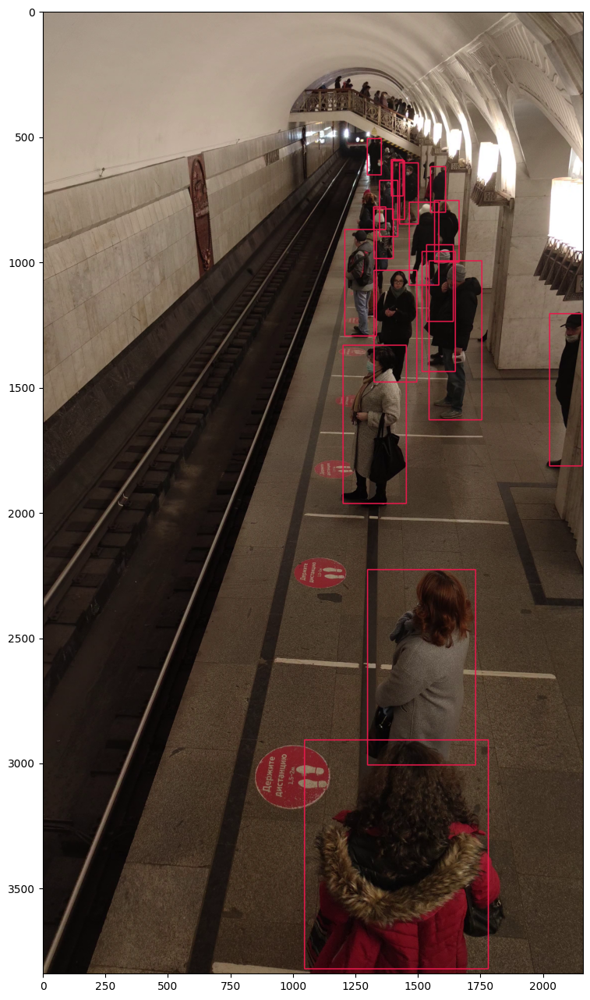

In [ ]:
import supervision as sv

# Extract video frame
frame_gen = sv.get_video_frames_generator(SUBWAY_VIDEO_PATH)
frame_iterator = iter(frame_gen)
frame = next(frame_iterator)

# Detect
output = predictor(frame)
detections = sv.Detections(xyxy=output['instances'].pred_boxes.tensor.cpu().numpy(),
                           confidence=output['instances'].scores.cpu().numpy(),
                           class_id=output['instances'].pred_classes.cpu().numpy().astype(int))

detections = filter_detections(detections=detections, class_ids=0)

# Annotate
if detections:
  box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
  frame = box_annotator.annotate(scene=frame, detections=detections, skip_label=True)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

## Apply polygon zone


In [ ]:
video_info = sv.VideoInfo.from_video_path(SUBWAY_VIDEO_PATH)
print(f'Video info: {video_info}')

Video info: VideoInfo(width=2160, height=3840, fps=29, total_frames=1298)


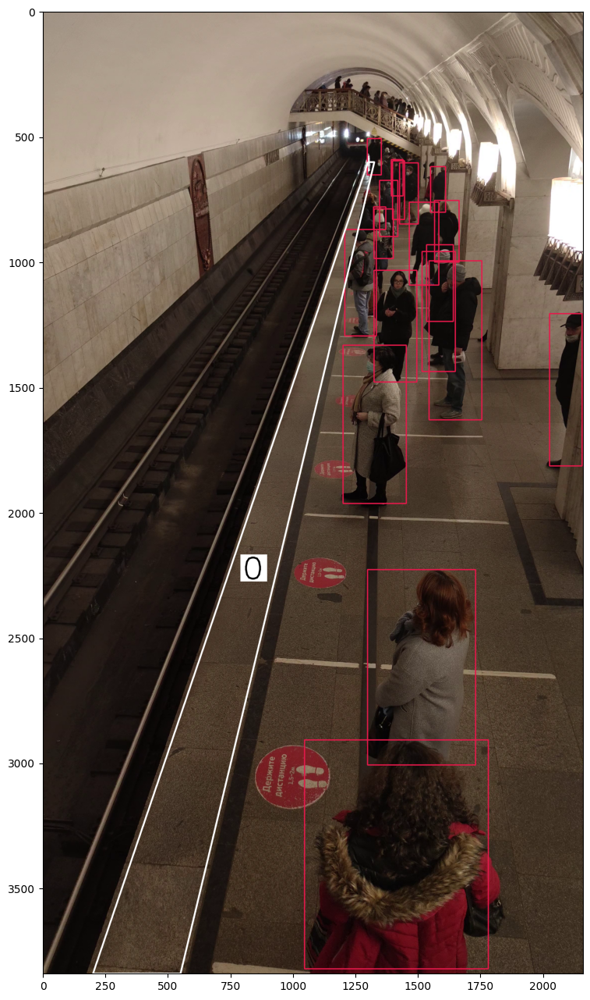

In [ ]:
import numpy as np
import supervision as sv

# Polygon zone
polygon_zone = np.array(
    [[200, 3840], [1300, 600], [1325, 600], [550, 3840]]
)

zone = sv.PolygonZone(polygon_zone, frame_resolution_wh=video_info.resolution_wh)

# Annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator= sv.PolygonZoneAnnotator(zone, color=sv.Color.white(), thickness=6, text_thickness=6, text_scale=4)

# Extract video frame
frame_gen = sv.get_video_frames_generator(SUBWAY_VIDEO_PATH)
frame_iterator = iter(frame_gen)
frame = next(frame_iterator)

# Detect
output = predictor(frame)
detections = sv.Detections(xyxy=output['instances'].pred_boxes.tensor.cpu().numpy(),
                           confidence=output['instances'].scores.cpu().numpy(),
                           class_id=output['instances'].pred_classes.cpu().numpy().astype(int))

detections = filter_detections(detections=detections, class_ids=0)

# Annotate
if detections:
  box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
  frame = box_annotator.annotate(scene=frame, detections=detections, skip_label=True)

frame = zone_annotator.annotate(scene=frame)

%matplotlib inline
sv.show_frame_in_notebook(frame, (16, 16))

Process the whole video

In [ ]:
import numpy as np
import supervision as sv

# Polygon zone
polygon_zone = np.array(
    [[200, 3840], [1300, 600], [1325, 600], [550, 3840]]
)

zone = sv.PolygonZone(polygon_zone, frame_resolution_wh=video_info.resolution_wh)

# Annotators
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
zone_annotator= sv.PolygonZoneAnnotator(zone, color=sv.Color.white(), thickness=6, text_thickness=6, text_scale=4)

def process_frame(frame: np.ndarray, _) -> np.ndarray:


  # Detect
  output = predictor(frame)
  detections = sv.Detections(xyxy=output['instances'].pred_boxes.tensor.cpu().numpy(),
                             confidence=output['instances'].scores.cpu().numpy(),
                             class_id=output['instances'].pred_classes.cpu().numpy().astype(int))

  detections = filter_detections(detections=detections, class_ids=0)

  # Annotate
  if detections:
    frame = box_annotator.annotate(scene=frame, detections=detections, skip_label=True)
    zone.trigger(detections=detections)
  frame = zone_annotator.annotate(scene=frame)


  return frame

sv.process_video(SUBWAY_VIDEO_PATH, f'{GOOGLE_DRIVE_VIDEOS_PATH}/subway_result.mp4',
                 callback=process_frame)

from IPython import display
display.clear_output()

## Last example

We will take a look at `market_square.mp4` video.
We will divide the frame into zones and count how many people are in those zones.

This time let's use `YOLOv5` algorithm.


In [ ]:
import torch

model = torch.hub.load('ultralytics/yolov5', 'yolov5x6')

/usr/local/lib/python3.10/dist-packages/torch/hub.py:294: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip


requirements: Ultralytics requirements ['gitpython>=3.1.30', 'pillow>=10.3.0'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.3/207.3 kB 5.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 21.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.7/62.7 kB 188.4 MB/s eta 0:00:00
  Attempting uninstall: pillow
    Found existing installation: Pillow 9.4.0
    Uninstalling Pillow-9.4.0:
      Successfully uninstalled Pillow-9.4.0

requirements: AutoUpdate success ✅ 8.8s, installed 2 packages: ['gitpython>=3.1.30', 'pillow>=10.3.0']
requirements: ⚠️ Restart runtime or rerun command for updates to take effect



YOLOv5 🚀 2024-5-19 Python-3.10.12 torch-2.2.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

100%|██████████| 270M/270M [00:01<00:00, 268MB/s]

Fusing layers... 
YOLOv5x6 summary: 574 layers, 140730220 parameters, 0 gradients, 209.6 GFLOPs
Adding AutoShape... 


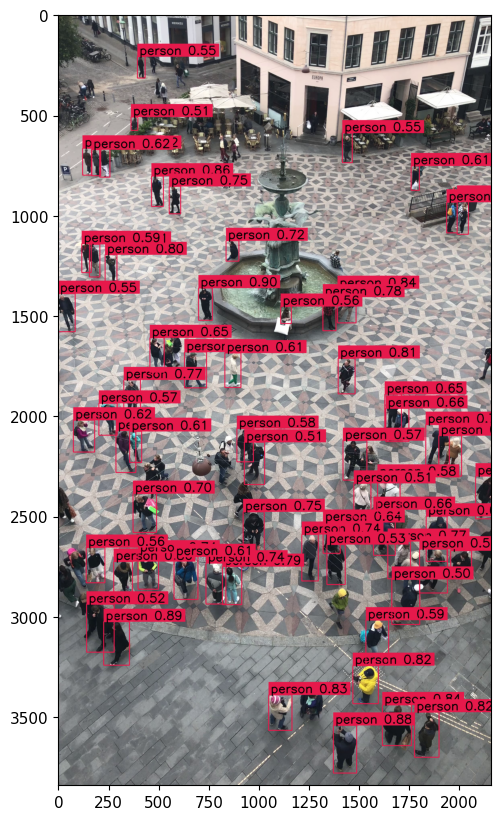

In [ ]:
import supervision as sv

# Get video frames
frame_gen = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO)
frame_iterator = iter(frame_gen)
frame = next(frame_iterator)

# Detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)

# Filter dections, choose only person classes
# Every detection is a tuple (coordinates - xyxy, probability, class, _)
detections = filter_detections(detections=detections, class_ids=0)

# Annotate
labels = [f'{model.names[class_id]} {confidence:.2f}' for _, confidence, class_id, _ in detections]
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)

%matplotlib inline
sv.show_frame_in_notebook(frame)

Show 9 detections


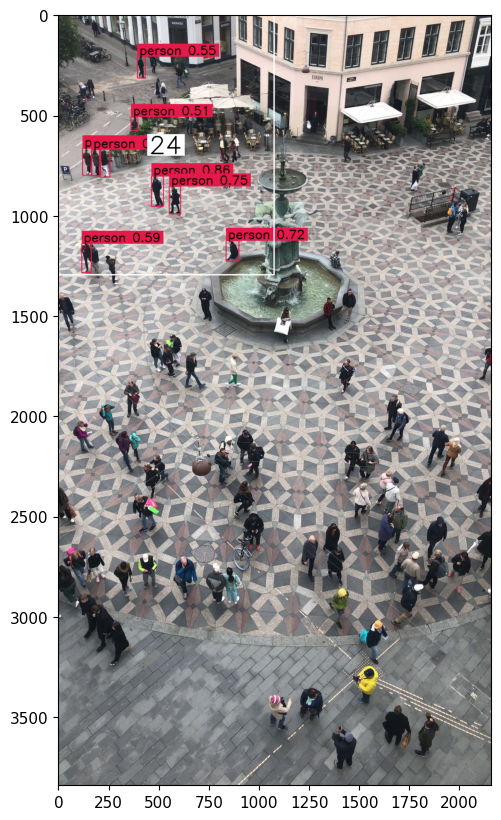

In [ ]:
import numpy as np
import supervision as sv

polygon_zone = np.array(
    [[0, 0], [1080-5, 0], [1080-5, 1300-5], [0, 1300-5]]
)
video_info = sv.VideoInfo.from_video_path(MARKET_SQUARE_VIDEO)
zone = sv.PolygonZone(polygon_zone, frame_resolution_wh=video_info.resolution_wh)

# Extract frame
frame_gen = sv.get_video_frames_generator(MARKET_SQUARE_VIDEO)
frame_iterator = iter(frame_gen)
frame = next(frame_iterator)

# Detect
results = model(frame, size=1280)
detections = sv.Detections.from_yolov5(results)
mask = zone.trigger(detections)

detections = filter_detections(detections=detections, class_ids=0,
                               mask=mask)

# Annotate
labels = [f'{model.names[class_id]} {confidence:.2f}' for _, confidence, class_id, _ in detections]
box_annotator = sv.BoxAnnotator(thickness=4, text_thickness=4, text_scale=2)
polygon_annotator = sv.PolygonZoneAnnotator(zone, color=sv.Color.white(),
                                            thickness=6, text_thickness=6,
                                            text_scale=4)

print(f'Show {len(detections)} detections')

frame = box_annotator.annotate(scene=frame, detections=detections, labels=labels)
frame = polygon_annotator.annotate(scene=frame)

%matplotlib inline
sv.show_frame_in_notebook(frame)
